# 2.1 PROBABILITY DISTRIBUTION TABLE - [5 MARKS]

In this section we are expected to create a probability distibution table with following variables
we are need asked to implement probability distribution table to answer a certain questions.

Before we begin let's visualize the question itself what are we actaully looking for

we are given a certain number of tips and a distribution containing wether the students follow a certain tip or not and if the follow how frequently they follow.

The distribution somehow looks like this-

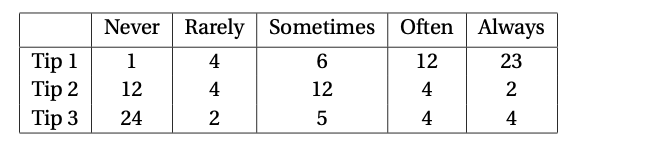

Let's try to visualize this on the code and see if we can create a probability distributation table to answer some of our questions

In [170]:
#necessary imports
from probability import *
from utils import print_table
from notebook import psource, pseudocode, heatmap

In [171]:
#since there is a dependence of the tip with following it hence we will be required to make a joint prob table
class ProbDist:
    """A discrete probability distribution. You name the random variable
    in the constructor, then assign and query probability of values.
    >>> P = ProbDist('Flip'); P['H'], P['T'] = 0.25, 0.75; P['H']
    0.25
    >>> P = ProbDist('X', {'lo': 125, 'med': 375, 'hi': 500})
    >>> P['lo'], P['med'], P['hi']
    (0.125, 0.375, 0.5)
    """

    def __init__(self, varname='?', freqs=None):
        """If freqs is given, it is a dictionary of values - frequency pairs,
        then ProbDist is normalized."""
        self.prob = {}
        self.varname = varname
        self.values = []
        if freqs:
            for (v, p) in freqs.items():
                self[v] = p
            self.normalize()

    def __getitem__(self, val):
        """Given a value, return P(value)."""
        try:
            return self.prob[val]
        except KeyError:
            return 0

    def __setitem__(self, val, p):
        """Set P(val) = p."""
        if val not in self.values:
            self.values.append(val)
        self.prob[val] = p

    def normalize(self):
        """Make sure the probabilities of all values sum to 1.
        Returns the normalized distribution.
        Raises a ZeroDivisionError if the sum of the values is 0."""
        total = sum(self.prob.values())
        if not isclose(total, 1.0):
            for val in self.prob:
                self.prob[val] /= total
        return self

    def show_approx(self, numfmt='{:.3g}'):
        """Show the probabilities rounded and sorted by key, for the
        sake of portable doctests."""
        return ', '.join([('{}: ' + numfmt).format(v, p)
                          for (v, p) in sorted(self.prob.items())])

    def __repr__(self):
        return "P({})".format(self.varname)

In [172]:
#simple probability distribution table

tip_1 = ProbDist(freqs={'Never': 1, 'Rarely': 4, 'Sometimes': 6,"Often":12,"Always":23})
tip_2 = ProbDist(freqs={'Never': 12, 'Rarely': 4, 'Sometimes': 12,"Often":4,"Always":2})
tip_3 = ProbDist(freqs={'Never': 24, 'Rarely': 2, 'Sometimes': 5,"Often":4,"Always":4})



## asking questions to the probabilty table ??

1- what is the probablity that a student always follows the tip 2

2- what is the probabilty that a student never follows tip 3

3- what is the probablity that a student follows tip2 sometimes only

In [173]:
#answering the questions based on the probability queries
print(tip_2['Always'])
print(tip_3['Never'])
print(tip_2['Sometimes'])

0.058823529411764705
0.6153846153846154
0.35294117647058826


## lets answer more complex questions 

1- what is the probabilty that a student rarely follows tip2 but always follow tip 1 and tip 3

2- what is the probability that a student never follows each of the tips

In [174]:
#in order to answer such questions we need a joint probability table 


In [175]:
full_joint = JointProbDist(['Never', 'Rarely', 'Sometimes',"Often","Sometimes","Always","tip_1","tip_2","tip_3"])
#for tip 1
full_joint[dict(tip_1=True, tip_2=False, tip_3=False,Never=True, Rarely=False, Sometimes=False,Often=False,Always=False)] = 1
full_joint[dict(tip_1=True, tip_2=False, tip_3=False,Never=False, Rarely=True, Sometimes=False,Often=False,Always=False)] = 4
full_joint[dict(tip_1=True, tip_2=False, tip_3=False,Never=False, Rarely=False, Sometimes=True,Often=False,Always=False)] = 6
full_joint[dict(tip_1=True, tip_2=False, tip_3=False,Never=False, Rarely=False, Sometimes=False,Often=True,Always=False)] = 12
full_joint[dict(tip_1=True, tip_2=False, tip_3=False,Never=False, Rarely=False, Sometimes=False,Often=False,Always=True)] = 23
#for tip_2

full_joint[dict(tip_1=False, tip_2=True, tip_3=False,Never=True, Rarely=False, Sometimes=False,Often=False,Always=False)] = 12
full_joint[dict(tip_1=False, tip_2=True, tip_3=False,Never=False, Rarely=True, Sometimes=False,Often=False,Always=False)] = 4
full_joint[dict(tip_1=False, tip_2=True, tip_3=False,Never=False, Rarely=False, Sometimes=True,Often=False,Always=False)] = 12
full_joint[dict(tip_1=False, tip_2=True, tip_3=False,Never=False, Rarely=False, Sometimes=False,Often=True,Always=False)] = 4
full_joint[dict(tip_1=False, tip_2=True, tip_3=False,Never=False, Rarely=False, Sometimes=False,Often=False,Always=True)] = 2

#for tip_3
full_joint[dict(tip_1=False, tip_2=False, tip_3=True,Never=True, Rarely=False, Sometimes=False,Often=False,Always=False)] = 24
full_joint[dict(tip_1=False, tip_2=False, tip_3=True,Never=False, Rarely=True, Sometimes=False,Often=False,Always=False)] = 2
full_joint[dict(tip_1=False, tip_2=False, tip_3=True,Never=False, Rarely=False, Sometimes=True,Often=False,Always=False)] = 5
full_joint[dict(tip_1=False, tip_2=False, tip_3=True,Never=False, Rarely=False, Sometimes=False,Often=True,Always=False)] = 4
full_joint[dict(tip_1=False, tip_2=False, tip_3=True,Never=False, Rarely=False, Sometimes=False,Often=False,Always=True)] = 4

# Student follows tip_2=True given that he Always following tip student ?

the question is different from what is the the probability that a student follows tip2 always ?

In the above question we already know that the student Always follows the tips(Coluld be any of the tips(1,2,3) but we need to find what is his chances that he follows tip_2)

In [176]:
#how many students in total follow tip_2 meaning tip_2 is set to True irrespective of other tips
full_joint.normalize()
#what is the probability that tip_2 will be true irrespective of other variables
#basically the total occurance of tip_2
evidence = dict(tip_2=True)
variables = ['tip_1', 'tip_3',"Rarely","Sometimes","Often","Always","Never"] # variables not part of evidence
ans1 = enumerate_joint(variables, evidence, full_joint)
ans1

0.2857142857142857

In [177]:

#here tip_2 will be true and Always will be also true

#another way to interpret the question is tip_2=True and Always=True

evidence = dict(tip_2=True,Always=True)
variables = ['tip_1', 'tip_3',"Rarely","Sometimes","Often","Never"] # variables not part of evidence
ans2 = enumerate_joint(variables, evidence, full_joint)
ans2

0.01680672268907563

Being able to find sum of probabilities satisfying given evidence allows us to compute conditional probabilities like **P(tip_2=True | Always=True)** as we can rewrite this as $$P(tip_2=True | Always = True) = \frac{P(tip_2=True \ and \ Always=True)}{P(tip_2=True)}$$

We have already calculated both the numerator and denominator.

In [178]:
#now lets see can we answer the above question given the fact that the student selected is always following student
ans2/ans1

0.058823529411764705

In [179]:
#or we could directly ask the given questions with enumerate joint ask 
#the result may vary a little because of the internal implementation of the two
query_variable = 'tip_2'
evidence = dict(Always=True)
ans = enumerate_joint_ask(query_variable, evidence, full_joint)
(ans[True], ans[False])

(0.06896551724137931, 0.9310344827586207)

# now let's begin to answer the complex questions asked in the begginning that we couldn't using simple probability distribution table

## what is the probabilty that a student rarely follows tip2 but always follow tip 1 and tip 3?

### lets break the following question into sub parts



$$P((tip_2=True \ and \  Rarely= True)\ and \ (tip_1=True \ and \ Always=True)\ and \ (tip_3=True\ and 
\ Always=True)) = {P(tip_2=True \ and \ Rarely=True)}\times{P(tip_1=True\ and \ Always=True)}\times{P(tip_3=True \ and \ Always=True)}$$

In [180]:
#person tip_2=True and rarely=True
evidence = dict(tip_2=True,Rarely=True)
variables = ['tip_1', 'tip_3',"Always","Sometimes","Often","Never"] # variables not part of evidence
ans1 = enumerate_joint(variables, evidence, full_joint)
ans1

#tip_1=True , Always= True
evidence = dict(tip_1=True,Always=True)
variables = ['tip_2',"tip_3","Rarely","Sometimes","Often","Never"] # variables not part of evidence
ans2 = enumerate_joint(variables, evidence, full_joint)
ans2

#tip_3=True and ALways=True
evidence = dict(tip_3=True,Always=True)
variables = ['tip_2',"tip_1","Rarely","Sometimes","Often","Never"] # variables not part of evidence
ans3 = enumerate_joint(variables, evidence, full_joint)
ans3

#finally question 1= (tip_2 and Rarely=True)*(tip_1 and Always =true)*(tip_3 and Always=True)
final=ans1*ans2*ans3 #remeber to normalize them here because it is a multiplication of probabilities
final

0.00021837701961654655

## as we have seen that more complex questions can be solved while breaking the expression into chunks and similarly by breaking the expression we can solve for the second question setting each tip to true and Never =True

Conclusions-

1- we can solve for many complex questions involving givens and ands using the joint probability table which we had trouble facing with original distribution table in the very first example

as we created 3 tables for for each of the tips

2- In the successful demo we with two examples : 

First involving the given statement 

Second involving ands of multiple statement

we answered the questions that were quite difficult for an individual table 

# Bayesian Networks [20 marks]

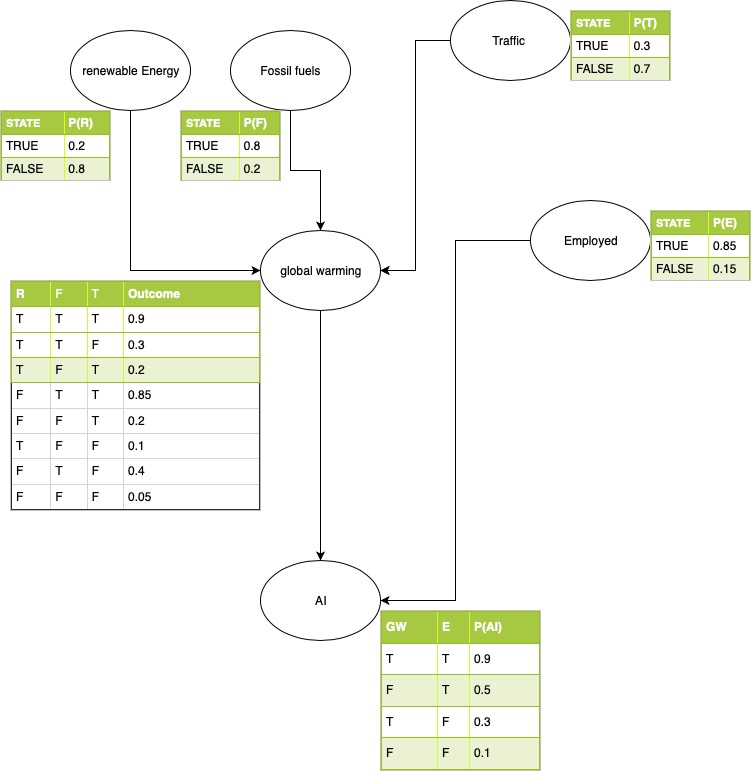


In the above task we notice that global warming is dependent on many individual nodes such as use of renewable energy, fossil fuel and cars stucking in traffic

when the global warming occurs and people are employed only then we see ai solutions being built to control the problem 

or in other case when people are not employed they country can't look for ai based solutions.

let's try to reconstruct the problem using the bayes net class


In [181]:
class BayesNet:
    """Bayesian network containing only boolean-variable nodes."""

    def __init__(self, node_specs=None):
        """Nodes must be ordered with parents before children."""
        self.nodes = []
        self.variables = []
        node_specs = node_specs or []
        for node_spec in node_specs:
            self.add(node_spec)

    def add(self, node_spec):
        """Add a node to the net. Its parents must already be in the
        net, and its variable must not."""
        node = BayesNode(*node_spec)
        assert node.variable not in self.variables
        assert all((parent in self.variables) for parent in node.parents)
        self.nodes.append(node)
        self.variables.append(node.variable)
        for parent in node.parents:
            self.variable_node(parent).children.append(node)

    def variable_node(self, var):
        """Return the node for the variable named var.
        >>> burglary.variable_node('Burglary').variable
        'Burglary'"""
        for n in self.nodes:
            if n.variable == var:
                return n
        raise Exception("No such variable: {}".format(var))

    def variable_values(self, var):
        """Return the domain of var."""
        return [True, False]

    def __repr__(self):
        return 'BayesNet({0!r})'.format(self.nodes)

In [182]:
#how to consider it as a node based problem

#independent nodes
Renewable_Energy_node = BayesNode('Renewable_Energy', '', 0.2)
Fossil_Fuels_node = BayesNode('Fossil_Fuels', '', 0.8)
Traffic_node = BayesNode('Traffic', '', 0.3)
Employed_node = BayesNode('Employed', '', 0.85)

In [183]:
# dependent nodes
Global_Warming_node = BayesNode('Global_Warming', ['Renewable_Energy', 'Fossil_Fuels',"Traffic"], 
                       {(True,True,True):0.9,
                        (True,True,False):0.3,
                        (True,False,True):0.2,
                        (False,True,True):0.85,
                        (False,False,True):0.2,
                        (True,False,False):0.1,
                        (False,True,False):0.4,
                        (False,False,False):0.05,
                       })

AI_node=BayesNode('AI', ['Global_Warming', 'Employed'], 
                       {(True, True): 0.9,(True, False): 0.3, (False, True): 0.5, (False, False): 0.1})

In [184]:
T,F = True,False
my_model = BayesNet([
                     ("Fossil_Fuels","",0.8),
                     ("Traffic","",0.3),
                     ("Employed","",0.85),
                     ("Renewable_Energy","",0.2),
                    ("Global_Warming",["Renewable_Energy","Fossil_Fuels","Traffic"],{(T,T,T):0.9,(T,T,F):0.3,(T,F,T):0.2,(F,T,T):0.85,(F,F,T):0.2,(T,F,F):0.1,(F,T,F):0.4,(F,F,F):0.05}),
                    ("AI",["Employed","Global_Warming"],{(T,T):0.9,(F,T):0.3,(T,F):0.5,(F,F):0.1})
])

In [185]:
my_model

BayesNet([('Fossil_Fuels', ''), ('Traffic', ''), ('Employed', ''), ('Renewable_Energy', ''), ('Global_Warming', 'Renewable_Energy Fossil_Fuels Traffic'), ('AI', 'Employed Global_Warming')])

In [186]:
type(my_model.variable_node("Traffic"))

probability.BayesNode

In [187]:
my_model.variable_node("Traffic").cpt

{(): 0.3}

In [188]:
my_model.variable_node("Global_Warming").cpt

{(True, True, True): 0.9,
 (True, True, False): 0.3,
 (True, False, True): 0.2,
 (False, True, True): 0.85,
 (False, False, True): 0.2,
 (True, False, False): 0.1,
 (False, True, False): 0.4,
 (False, False, False): 0.05}

In [189]:
def enumerate_all(variables, e, bn):
    """Return the sum of those entries in P(variables | e{others})
    consistent with e, where P is the joint distribution represented
    by bn, and e{others} means e restricted to bn's other variables
    (the ones other than variables). Parents must precede children in variables."""
    if not variables:
        return 1.0
    Y, rest = variables[0], variables[1:]
    Ynode = bn.variable_node(Y)
    if Y in e:
        return Ynode.p(e[Y], e) * enumerate_all(rest, e, bn)
    else:
        return sum(Ynode.p(y, e) * enumerate_all(rest, extend(e, Y, y), bn)
                   for y in bn.variable_values(Y))

In [190]:
def enumeration_ask(X, e, bn):
    """Return the conditional probability distribution of variable X
    given evidence e, from BayesNet bn. [Figure 14.9]
    >>> enumeration_ask('Burglary', dict(JohnCalls=T, MaryCalls=T), burglary
    ...  ).show_approx()
    'False: 0.716, True: 0.284'"""
    assert X not in e, "Query variable must be distinct from evidence"
    Q = ProbDist(X)
    for xi in bn.variable_values(X):
        Q[xi] = enumerate_all(bn.variables, extend(e, X, xi), bn)
    return Q.normalize()

Let us solve the problem of finding out **P(AI=True | Global_Warming=True, Empployed=True)** using the **my_model** network. **enumeration_ask** takes three arguments **X** = variable name, **e** = Evidence (in form a dict like previously explained), **bn** = The Bayes Net to do inference on.

In [191]:
#verify the AI from the table given that global warming and employed = True
ans_dist = enumeration_ask("AI",{"Global_Warming":True, "Employed":True}, my_model)
ans_dist[True]

0.9

### Variable Elimination

The enumeration algorithm can be improved substantially by eliminating repeated calculations. In enumeration we join the joint of all hidden variables. This is of exponential size for the number of hidden variables. Variable elimination employes interleaving join and marginalization.

Before we look into the implementation of Variable Elimination we must first familiarize ourselves with Factors. 

In general we call a multidimensional array of type P(Y1 ... Yn | X1 ... Xm) a factor where some of Xs and Ys maybe assigned values. Factors are implemented in the probability module as the class **Factor**. They take as input **variables** and **cpt**. 


#### Helper Functions

There are certain helper functions that help creating the **cpt** for the Factor given the evidence. Let us explore them one by one.

**make_factor** is used to create the **cpt** and **variables** that will be passed to the constructor of **Factor**. We use **make_factor** for each variable. It takes in the arguments **var** the particular variable, **e** the evidence we want to do inference on, **bn** the bayes network.

Here **variables** for each node refers to a list consisting of the variable itself and the parents minus any variables that are part of the evidence. This is created by finding the **node.parents** and filtering out those that are not part of the evidence.

The **cpt** created is the one similar to the original **cpt** of the node with only rows that agree with the evidence.



In [192]:
def make_factor(var, e, bn):
    """Return the factor for var in bn's joint distribution given e.
    That is, bn's full joint distribution, projected to accord with e,
    is the pointwise product of these factors for bn's variables."""
    node = bn.variable_node(var)
    variables = [X for X in [var] + node.parents if X not in e]
    cpt = {event_values(e1, variables): node.p(e1[var], e1)
           for e1 in all_events(variables, bn, e)}
    return Factor(variables, cpt)

def all_events(variables, bn, e):
    """Yield every way of extending e with values for all variables."""
    if not variables:
        yield e
    else:
        X, rest = variables[0], variables[1:]
        for e1 in all_events(rest, bn, e):
            for x in bn.variable_values(X):
                yield extend(e1, X, x)

The **all_events** function is a recursive generator function which yields a key for the orignal **cpt** which is part of the node. This works by extending evidence related to the node, thus all the output from **all_events** only includes events that support the evidence. Given **all_events** is a generator function one such event is returned on every call. 

We can try this out using the example on **Page 524** of the book. We will make **f**<sub>5</sub>(A) = P(m | A)

## answering the queries based on the table (where the direct relationship does not exist)

for example- in this section we will fetch a few queries that do not have a direct relation
as in case with global warming it is directly related with occurance of fossil fuels, Renewable energy and Traffic
but what if we want to predict global warming with only two variables.

Example 2- the relation of AI with respect to Fossil fuels and Employement ?


In [193]:
f5 = make_factor("Global_Warming",{"Fossil_Fuels":True,"Traffic":True},my_model)

In [194]:
f5

In [195]:
f5.cpt

{(True, True): 0.9,
 (False, True): 0.09999999999999998,
 (True, False): 0.85,
 (False, False): 0.15000000000000002}

In [196]:
f5.variables

['Global_Warming', 'Renewable_Energy']

In [197]:
f5 = make_factor("AI",{"Fossil_Fuels":False,"Employed":True},my_model)

In [198]:
f5.cpt

{(True, True): 0.9,
 (False, True): 0.09999999999999998,
 (True, False): 0.5,
 (False, False): 0.5}

In [199]:
f5.variables

['AI', 'Global_Warming']

# How does Naive bayes actually work ?

## before I begin explaining the Naive Bayes algorithm 

I would like to source the blog that I am reffering for this demonstation of the concept

source- http://shatterline.com/blog/2013/09/12/not-so-naive-classification-with-the-naive-bayes-classifier/

<b>What is Bayes theoram ?</b>

there are three bags that contain 2 types of balls(RED & BLUE)

BAG1- 2 Red and 5 Blue
BAG2- 5 Red and 2 Blue
BAG3- 2 Red and 3 Blue

Ques- given that red ball was selected what is the probability that it came from BAG3 ?

let's numerically change the question to solve our problem

let each of the bags be denoted as E1, E2 and E3

then, Probability of selecting any bag can be written as,

P(E1)=P(E2)=P(E3)=1/3

now we denote the event (A) as drawing the red ball.

then probability of drawing red balls from each of the bag can be written as 

P(A|E1)=2/7
P(A|E2)=5/7
P(A|E3)=2/5

We can represent the question in a mathematical symbol as

P(E3|A)=?

which we are aiming to solve using the Bayes theoram

According to Bayes theoram,

P(E3|A)=P(A|E3) * P(E3) / (P(A|E1)P(E1)+P(A|E2)P(E2)+P(A|E3)P(E3))

or in general we can write the formula as,

$$P(E3 | A) = \frac{P(A | E3) \times P(E3) }{P(A | E1) \times P(E1) + P(A | E2) \times P(E2) + P(A | E3) \times P(E3)}$$

Computing the values already calculated in the expression , we will get,

$$P(E3 | A) = \frac{ 2/5 \times 1/3 }{2/7 \times 1/3 + 5/7 \times 1/3 + 2/5 \times 1/3}$$

thus P(E3|A) was found out to be <b>0.2857142857</b>


We could also simply rewrite the entire bayes formula in a much clear representation such as,

$$P(E_i | A) = \frac{P(A | E_i) \times P(E_i) }{P(A)}$$

or more generally as,

$$P(A | B) = \frac{P(B | A) \times P(A) }{P(B)}$$

<b>if P(B) not equals to 0</b>

The above generalized result is very important, we will later use it for deriving Naive Bayes

# coming over to the naive Bayes and linking it to the Bayes theoram

we are given a set of variables which actually define a parameter say y

so in the data we have certain x1,x2,x3,x4 that define the outcome Y

for example consider the below given example


In [200]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "http://shatterline.com/blog/wp-content/uploads/2013/09/nicer-tennis-data.png")

The data contains all the information for several days and we are trying to predict wether at any given random day we should go out to play or not based on the readings from the 4 given features <b>(Outlook, Temperature, Humidity, Wind)</b>

Mathematically can be written as,using the generalized formula of Bayes Theoram

$$P(C_k | X) = \frac{P(X | C_k) \times P(C_k) }{P(X)}$$

where C_k denotes the class label and X denotes the row sample of a Day

The expression has 4 different terms and each of them has their own significance and a name associated, Below highlighted image showcases what each of those terms are called and how they can be interpreted for predicting the class labels

In [201]:
Image(url= "http://shatterline.com/blog/wp-content/uploads/2013/09/bayes-pictorial5.png")

In the above image we splitted the entire Dependence of class label on each row to the dependence of the class with individual feature this can only be incorporated if the data has conditional independence meaning we can only apply the principle on conditionally independent features which in real life are rarely to be honest.

<b>Hence the algorithm is called Naive (As it assumes that features have no correlation with each other.)</b>

After assuming the conditional independence the expression can be split into multiple expressions with different feature in each as,

<b>P(x1, x2 …, xk | Classj) = ∏i P(xi, | Classj), or

P(x1, x2 …, xk | Classj) = P(x1 | Classj) × P(x2 | Classj) ×…× P(xk | Classj)</b>

Since the denominator P(x) will be same in the denominator for both of the classes i.e when play= Yes and when play= No

so it does not really impact alot on the label outcomes so for the moment let's just focus on the Numerator of the expression calculated.

hence the expression really boils down to calculating posterior for each of the feature

<b>P(class_play=Yes)=P(x1|class_play=Yes) * P(x2|class_play=Yes) *....... P(xn|class_play=Yes) * P(class_play=Yes)</b>

we can very easily visualize the posteriors with the help of the table given below

In [202]:
Image(url= "http://shatterline.com/blog/wp-content/uploads/2013/09/class-probabilities.png")
Image(url= "http://shatterline.com/blog/wp-content/uploads/2013/09/probabilities-3.png")

Let’s say, we get a new instance of the weather condition, 

<b>x’=(Outlook=Sunny, Temperature=Cool, Humidity=High, Wind=Strong) that will have to be classified (i.e., are we going to play tennis under the conditions specified by x’).</b>

With the MAP rule, we compute the posterior probabilities. This is easily done by  looking up the tables we built above.

$$P(ClassPlay=Yes|x’) = {P(Sunny | ClassPlay=Yes)} \times {P(Cool | ClassPlay=Yes)} \times {P(High|ClassPlay=Yes)} \times {P(Strong|ClassPlay=Yes))} \times {P(ClassPlay=Yes)}$$

  <b>= 2/9 × 3/9 × 3/9 × 3/9 × 9/14 = 0.0053</b>

$$P(ClassPlay=No| x’) =  {P(Sunny | ClassPlay=No)} \times {P(Cool | ClassPlay=No)} \times {P(High | ClassPlay=No)} \times {P(Strong | ClassPlay=No)} \times {P(Class_Play=No)}$$

<b>= 3/5 × 1/5 × 4/5 × 3/5 × 5/14 = 0.0205</b>

<b>Since P(ClassPlay=Yes|x’) less than P(ClassPlay=No|x’), we classify the new instance x’ to be “No”. </b>

## what is the time complexity of the Algorithm

in order to evaluate time complexity we will say there are n rows in the data C categorical labels and d dimensions or features

then the time complexity is the number of operations required to make the look uptable is in the order of O(n*d*C)

however the space time complexity is very low as we only need to save O(d*c) such look up values in a look up table

hence many of the low latency systems prefer to use Naive Bayes instead of any other algorithm becuase it takes very low time.

<b>fun fact - despite of the fact that there is a condional independence assumption it still works like a charm for many of the applications, One such example is the spam filter classification, It was one of the first models initially proposed for spam detection and today used as benchmark to compare all other recently developed algorithms </b>

## however it would be incomplete if I finish the topic without addressing two of the issues with Naive Bayes, That we will fix using the multinomial Naive Bayes approach

1-problem if one of the feature has 0 occurance
2-It is called the issue of numerical stability

In the first problem if say P(Sunny|classPlay=No) =0 meaning that for every occurance of Sunny there was no play condition equal to No then it could impact all the other values calculated and will turn everything to 0

To encounter that we use Laplace additive smoothing parameter called alpha

The smoothing parameter ensures that if the occurance of the word is 0 even then the output would not go to zero, it will become a small value but not 0 thus preventing the entire expression to go down


In [203]:
Image(url= "https://qph.fs.quoracdn.net/main-qimg-82af0a002409ddb2b5efc0c7a4ff123a")

for example,

say alpha =1(smoothing parameter)
here d is the distinct values that a class can have in our weather example it will be 2
and samples will be say 10

then the expression or probability of each word becomes
$$P(alpha_smoothed)=\frac{0 + 10}{100+1 \times 2}$$

<b>hence the values turns out to be 1/102 which is not equal to 0 as it would have been if we had followed emperical formula</b>

2- in the second problem multiplication of many such small entities could lead to a value rounded to 0 this problem is called numerical stability issue in python 16 significant digits after the decimal place are considered and with large number of features we can get into a problem where the multiplication of the probabilities could result into a value rounded up to zero

In order to deal with this problem we use log probabilities

for each probablity calculated 

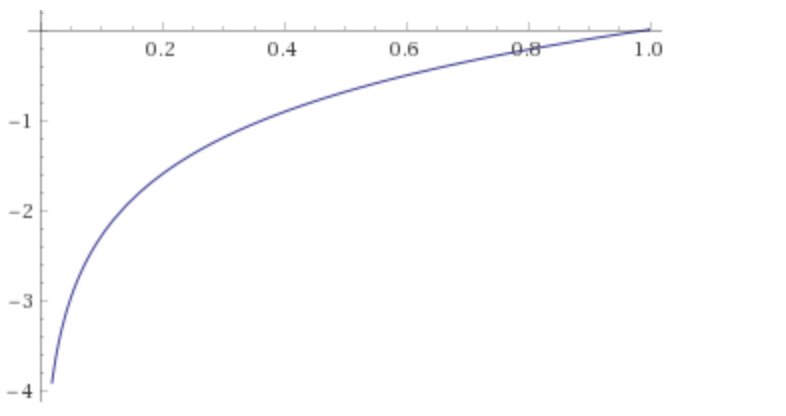

Since log is monotonic function means strictly increasing given any value between 0 and 1 we will get a negative value of a much bigger number associated with each liklihood, We could simply ignore the -ve sign and do the sum of each of the probabilities

P(C|x) = P(C|x1)* P(C|x2) * P(C|x3)............P(C|xn)

will now become, using the properties of log

log(P(C|X))= log(P(C|X1)) + log(P(C|X2)) + log(P(C|X3)) ........... + log(P(C|Xn)) 

we calculate each of these probabilities and whichever is greater for each class type will say that the result is that class

In the above example we have explained all three aspects in calculation of posterior probabilities i.e.

* Compute the “Prior” probabilities for each of the classes.
* Compute the probability of evidence.
* Compute the probability of likelihood of evidences (numerator).

<b>According to grading rubric provided</b>

# Visualizing the selected datasets

#  1- loan dataset

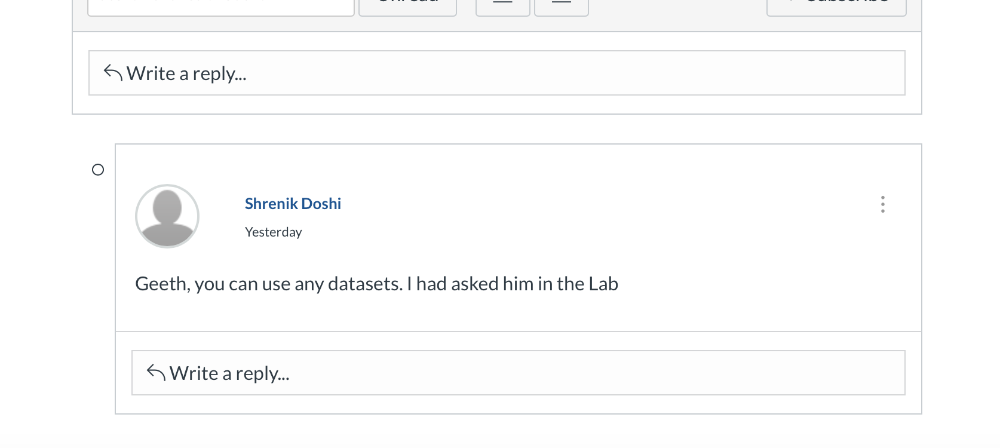

As discussed in the lab with the profesor and on the discussion forum we are allowed to  pick any dataset and not just the ones available on the uci Machine learning repository

In [35]:
import pandas as pd 
from tqdm import tqdm
import numpy as np
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import scipy.io as sio
warnings.filterwarnings("ignore")
name=["rate","installment","log.annual.inc","dti","fico","days.with.cr.line","revol.bal","revol.util","inq.last.6mths","delinq.2yrs","pub.rec","not.fully.paid","credit.policy"]#these are the dataset feature names
df = pd.read_csv("aima-data/loan_data.csv",names=name)
df.head()


,rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,credit.policy
0,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0,1
1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0,1
2,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0,1
3,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0,1
4,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0,1


In [36]:
df.shape

(9578, 13)

## explaining each of the dataset features(There are 13 features)

the last column of the dataset explains if we the loan will be granted (1) or not (0)

In [37]:
minority=df['credit.policy'].value_counts()[0]
majority=df['credit.policy'].value_counts()[1]

so we have 7709 samples that were granted loan and 1868 samples that were not granted

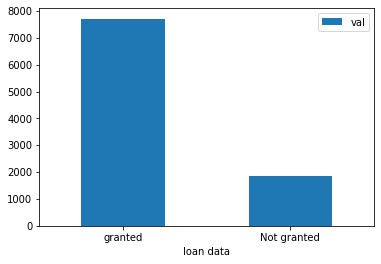

In [38]:
df_bar = pd.DataFrame({'loan data':['granted', 'Not granted'], 'val':[majority, minority]})
ax = df_bar.plot.bar(x='loan data', y='val', rot=0)

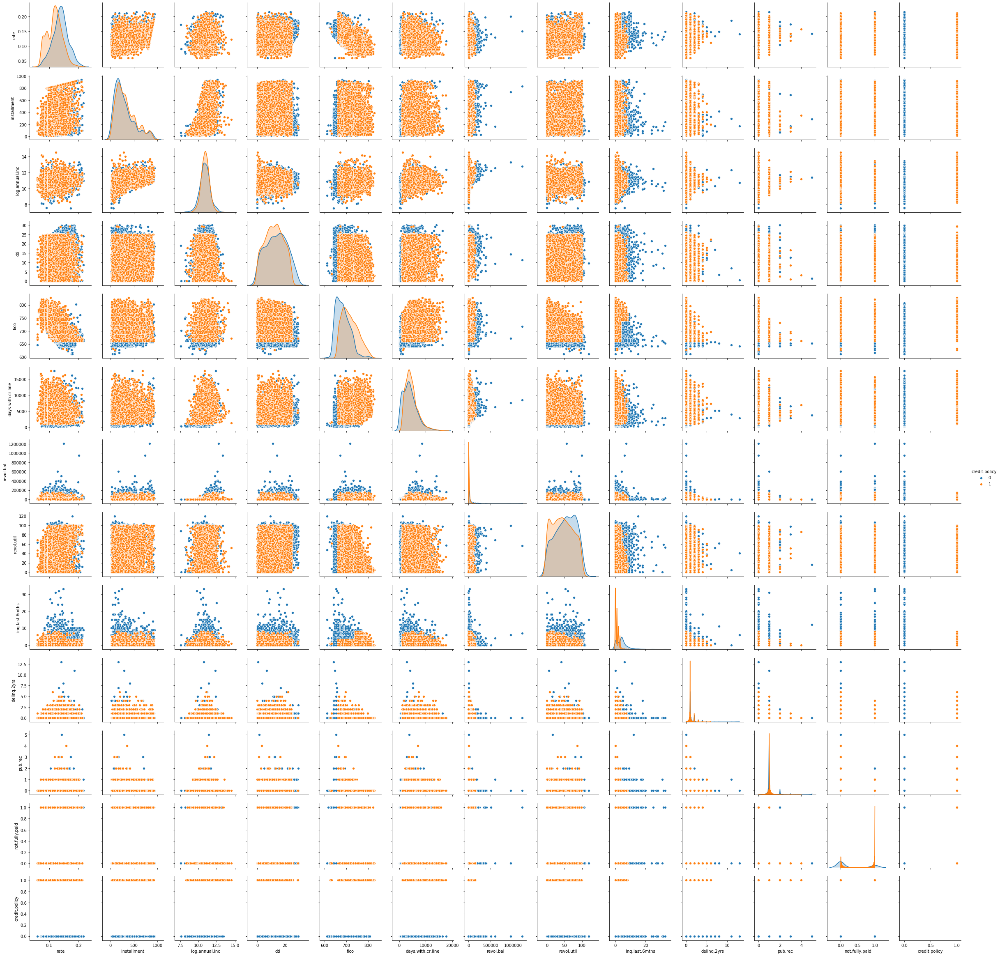

In [39]:
# drawing the pairplot of each feature
#denotes the relation of credit policy with all the other features in the data
g = sns.pairplot(df, hue='credit.policy')

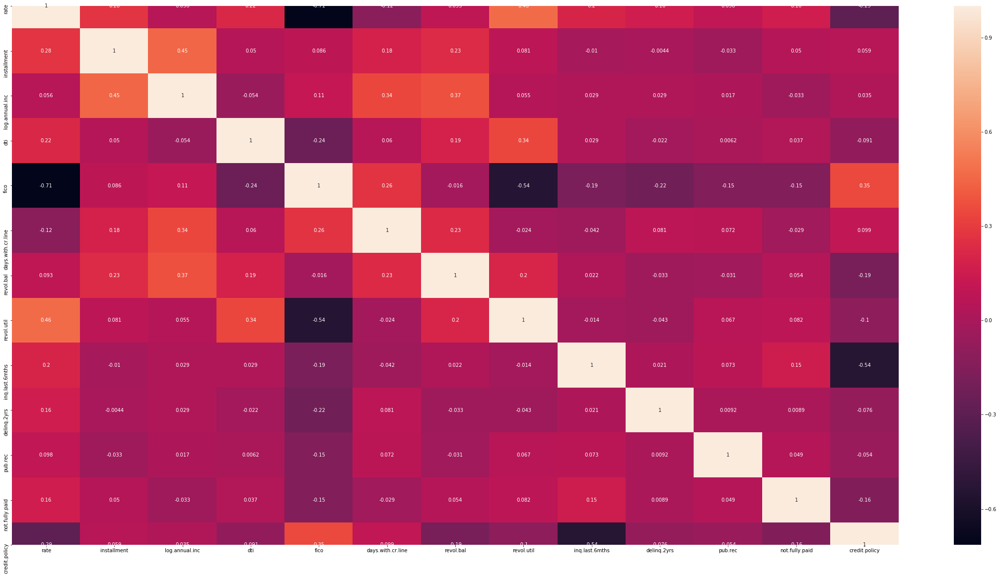

In [40]:
#visualizing the heat map and seeing any correlation among the features
fig=plt.figure(figsize=(40,20))
p1 = sns.heatmap(df.corr(),annot=True)


shape of pca_reduced.shape =  (9578, 3)
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
(9578, 3) (9578,)


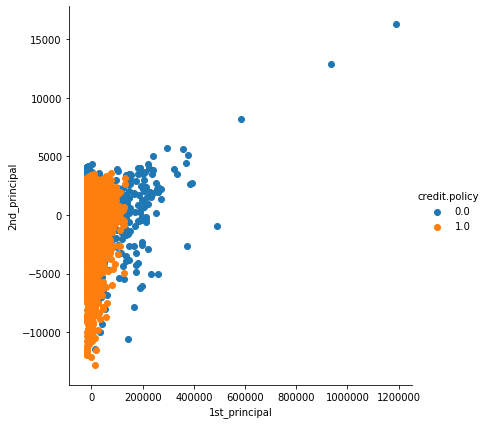

In [41]:
#since the data has too many features let's visualize them using some advanced dimensionality techniques such as PCA
#and TSNE 
x=df.iloc[:,:-1]
y=df.iloc[:,-1]


# initializing the pca for visualization
from sklearn import decomposition
pca = decomposition.PCA()
labels=y.copy(deep=True).to_numpy()
# configuring the parameteres
# the number of components = 2
pca.n_components = 3
pca_data = pca.fit_transform(x)

# pca_reduced will contain the 2-d projects of simple data
print("shape of pca_reduced.shape = ", pca_data.shape)
print(type(pca_data),type(labels))
print(pca_data.shape,labels.shape)
pca_data = np.vstack((pca_data.T, labels)).T
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "3rd_principal","credit.policy"))
sns.FacetGrid(pca_df, hue="credit.policy", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()

#3d plot on pca
import plotly.express as px

fig = px.scatter_3d(pca_df, x="1st_principal", y="2nd_principal", z="3rd_principal",
                    color="credit.policy")
fig.show()

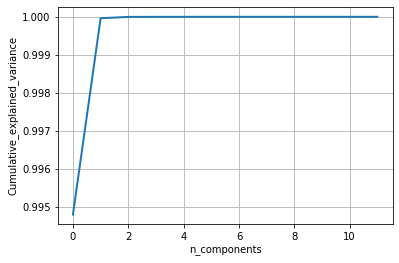

In [42]:
# PCA for dimensionality redcution (non-visualization)
pca.n_components = x.shape[1]
pca_data = pca.fit_transform(x)
percentage_var_explained = pca.explained_variance_ / np.sum(pca.explained_variance_);
cum_var_explained = np.cumsum(percentage_var_explained)
#do a cumlative sum
# Plot the PCA spectrum
plt.figure(1, figsize=(6, 4))
plt.clf()
plt.plot(cum_var_explained, linewidth=2)
plt.axis('tight')
plt.grid()
plt.xlabel('n_components')
plt.ylabel('Cumulative_explained_variance')
plt.show()

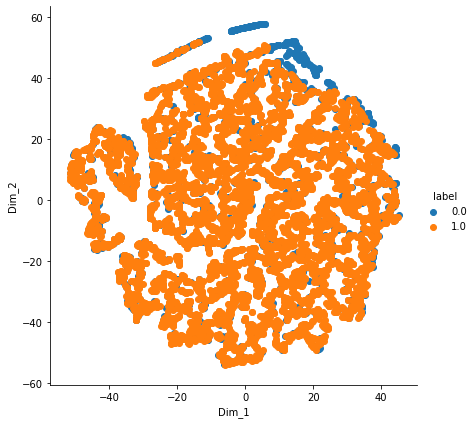

In [43]:
# https://github.com/pavlin-policar/fastTSNE you can try this also, this version is little faster than sklearn 
from sklearn.manifold import TSNE
model = TSNE(n_components=2, random_state=0 ,n_iter=500,perplexity=20) #random states for reproducable results
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000(n_iter)
tsne_data = model.fit_transform(x)
# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sns.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.show()

from sklearn.manifold import TSNE
model = TSNE(n_components=3, random_state=0 ,n_iter=500,perplexity=20) #random states for reproducable results
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000(n_iter)
tsne_data = model.fit_transform(x)
tsne_data = np.vstack((tsne_data.T, labels)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "Dim_3","label"))
tsne_df.describe()

import plotly.express as px

fig = px.scatter_3d(tsne_df, x='Dim_1', y='Dim_2', z='Dim_3',
                    color='label')
fig.show()

#clearly three Tsne axis are not enough to vizualize the data as there is no clear seperation or regions possible

### lets try to run the visualization aspect on the second dataset

in this section we will try to visualize the data from a famous cartoon show called pokemon

1- we will import the data from a csv file and do some preprocessing

2- the classification is based on anomalies where are trying to classsify the Legendary type of pokemons which are very few



here the anomaly class is the Legendary type pokemon 
while the inlier class is the non legendary type pokemon

# Loading the dataset -2 this is the pokemon dataset

In [128]:
#load data to a data frame
df = pd.read_csv("aima-data/Pokemon.csv")
df.head()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


In [129]:
df.shape

(800, 13)

The data has 683 rows and 9 columns

In [130]:
#replacing the true false labels with 0 and 1
df.Legendary.replace({True:1,False:0},inplace=True)
df.head()
#look for both the labels 
unique_labels_t1=list(df["Type 1"].unique())
unique_labels_t2=list(df["Type 2"].unique())
print(unique_labels_t1==unique_labels_t2)#false becasue of the nan element 

#true becasue the number of each unique elements pers list is the same 
for elements in unique_labels_t1:
    if(type(elements)!=type(str())):
        unique_labels_t1.remove(elements)
for elements in unique_labels_t2:
    if(type(elements)!=type(str())):
        unique_labels_t2.remove(elements)
print(unique_labels_t1.sort()==unique_labels_t2.sort())
print(unique_labels_t1)

False
True
['Bug', 'Dark', 'Dragon', 'Electric', 'Fairy', 'Fighting', 'Fire', 'Flying', 'Ghost', 'Grass', 'Ground', 'Ice', 'Normal', 'Poison', 'Psychic', 'Rock', 'Steel', 'Water']


In [131]:
#converting thm back to the one hot encoding format
one_hot_form_1 = pd.get_dummies(df['Type 1'])
one_hot_form_2 = pd.get_dummies(df['Type 2'])
display(one_hot_form_1.shape)
#display(one_hot_form_2.describe())

#as we can see now the values of the one hot form are pretty good

(800, 18)

In [132]:
#since both col have the same 18 columns we can make combined form of both type 1 and type 2 type one hot encoding 
final=pd.DataFrame(index=one_hot_form_1.index)
for column_name in unique_labels_t1:
    final[column_name] = one_hot_form_1[column_name] + one_hot_form_2[column_name]
final.head()

,Bug,Dark,Dragon,Electric,Fairy,Fighting,Fire,Flying,Ghost,Grass,Ground,Ice,Normal,Poison,Psychic,Rock,Steel,Water
0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [133]:
final.describe()

,Bug,Dark,Dragon,Electric,Fairy,Fighting,Fire,Flying,Ghost,Grass,Ground,Ice,Normal,Poison,Psychic,Rock,Steel,Water
count,800.000000,800.00000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.00000,800.000000,800.000000,800.000000,800.000000
mean,0.090000,0.06375,0.062500,0.062500,0.050000,0.066250,0.080000,0.126250,0.057500,0.118750,0.083750,0.047500,0.127500,0.07750,0.112500,0.072500,0.061250,0.157500
std,0.286361,0.24446,0.242213,0.242213,0.218081,0.248874,0.271463,0.332339,0.232941,0.323696,0.277186,0.212839,0.333741,0.26755,0.316178,0.259476,0.239938,0.364499
min,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000


In [134]:
df= pd.concat([df,final],sort=False,axis=1)
df.head()
df=df.drop(['Type 1','Type 2'], axis=1)
df.head()

,#,Name,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,...,Ghost,Grass,Ground,Ice,Normal,Poison,Psychic,Rock,Steel,Water
0,1,Bulbasaur,318,45,49,49,65,65,45,1,...,0,1,0,0,0,1,0,0,0,0
1,2,Ivysaur,405,60,62,63,80,80,60,1,...,0,1,0,0,0,1,0,0,0,0
2,3,Venusaur,525,80,82,83,100,100,80,1,...,0,1,0,0,0,1,0,0,0,0
3,3,VenusaurMega Venusaur,625,80,100,123,122,120,80,1,...,0,1,0,0,0,1,0,0,0,0
4,4,Charmander,309,39,52,43,60,50,65,1,...,0,0,0,0,0,0,0,0,0,0


In [135]:
#now we will extract the numerical row features
numerical_features=["Total","HP","Attack","Defense","Sp. Atk","Sp. Def","Speed"]
numerical_df=df[numerical_features]
numerical_df.head()

,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed
0,318,45,49,49,65,65,45
1,405,60,62,63,80,80,60
2,525,80,82,83,100,100,80
3,625,80,100,123,122,120,80
4,309,39,52,43,60,50,65


In [136]:
#these are the categorical features
categorical_df=df.iloc[:,9:]

In [137]:
#concatenating numerical and categorical features
final= pd.concat([numerical_df,categorical_df],sort=False,axis=1) #column wise concatinate 
final.describe()

#add a shuffling parameter

y=final["Legendary"]
x=final.drop(["Legendary"],axis=1)
print(x.shape,y.shape)




(800, 26) (800,)


In [138]:
df=pd.concat([x, y], axis = 1).T.drop_duplicates().T
df.head()
import copy
poke_data=copy.deepcopy(df)
minority=df['Legendary'].value_counts()[0]
majority=df['Legendary'].value_counts()[1]


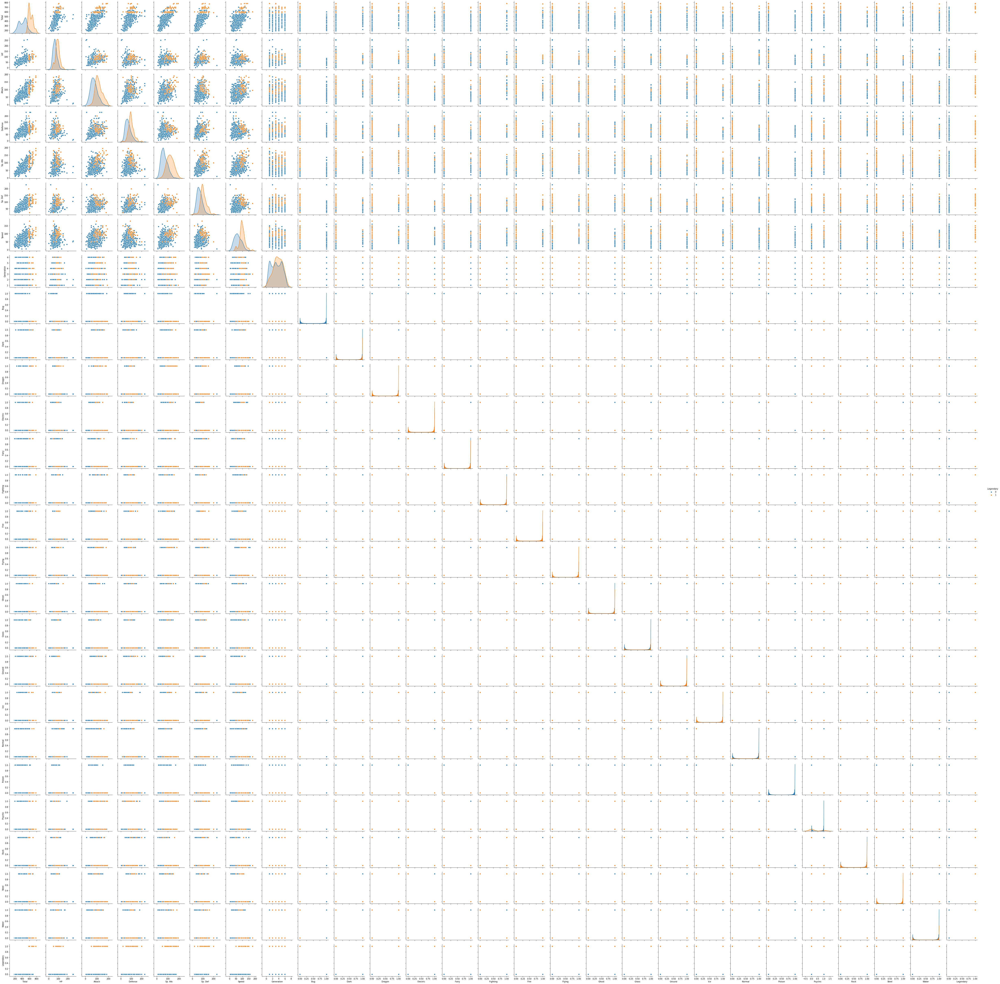

In [117]:
# drawing the pairplot of each feature
#denotes the relation of credit policy with all the other features in the data
g = sns.pairplot(df, hue='Legendary')

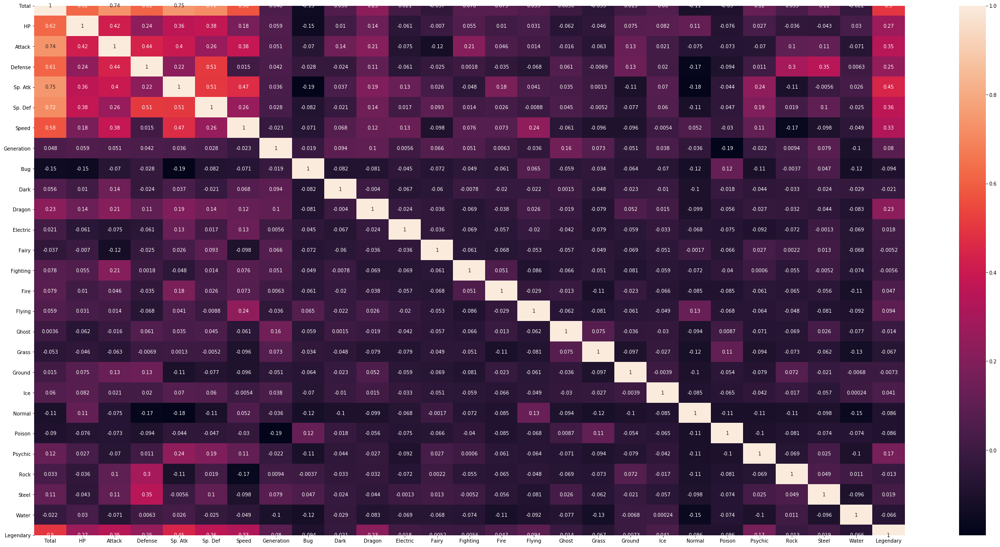

In [118]:
#visualizing the heat map and seeing any correlation among the features
fig=plt.figure(figsize=(40,20))
p1 = sns.heatmap(df.corr(),annot=True)



shape of pca_reduced.shape =  (800, 3)
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
(800, 3) (800,)


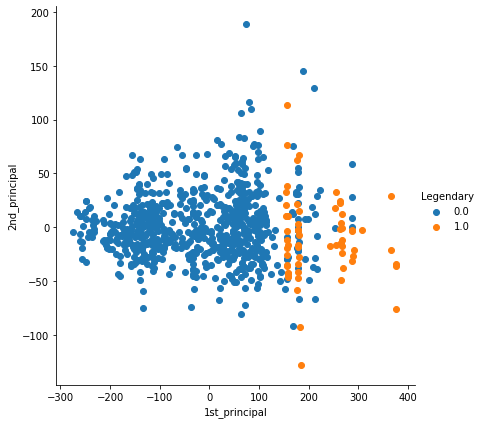

In [119]:
#since the data has too many features let's visualize them using some advanced dimensionality techniques such as PCA
#and TSNE 
x=df.iloc[:,:-1]
y=df.iloc[:,-1]

# initializing the pca for visualization
from sklearn import decomposition
pca = decomposition.PCA()
labels=y.copy(deep=True).to_numpy()
# configuring the parameteres
# the number of components = 2
pca.n_components = 3
pca_data = pca.fit_transform(x)

# pca_reduced will contain the 2-d projects of simple data
print("shape of pca_reduced.shape = ", pca_data.shape)
print(type(pca_data),type(labels))
print(pca_data.shape,labels.shape)
pca_data = np.vstack((pca_data.T, labels)).T
# creating a new data fram which help us in ploting the result data
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal", "2nd_principal", "3rd_principal","Legendary"))
sns.FacetGrid(pca_df, hue="Legendary", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.show()

#3d plot on pca
import plotly.express as px

fig = px.scatter_3d(pca_df, x="1st_principal", y="2nd_principal", z="3rd_principal",
                    color="Legendary")
fig.show()

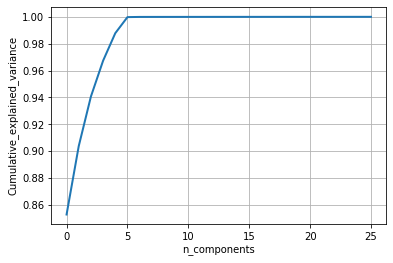

In [120]:
# PCA for dimensionality redcution (non-visualization)
pca.n_components = x.shape[1]
pca_data = pca.fit_transform(x)
percentage_var_explained = pca.explained_variance_ / np.sum(pca.explained_variance_);
cum_var_explained = np.cumsum(percentage_var_explained)
#do a cumlative sum
# Plot the PCA spectrum
plt.figure(1, figsize=(6, 4))
plt.clf()
plt.plot(cum_var_explained, linewidth=2)
plt.axis('tight')
plt.grid()
plt.xlabel('n_components')
plt.ylabel('Cumulative_explained_variance')
plt.show()

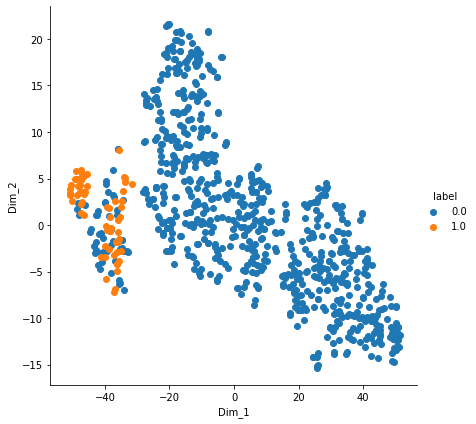

In [121]:
# https://github.com/pavlin-policar/fastTSNE you can try this also, this version is little faster than sklearn 
from sklearn.manifold import TSNE
model = TSNE(n_components=2, random_state=0 ,n_iter=500,perplexity=30) #random states for reproducable results
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000(n_iter)
tsne_data = model.fit_transform(x)
# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sns.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.show()

from sklearn.manifold import TSNE
model = TSNE(n_components=3, random_state=0 ,n_iter=500,perplexity=30) #random states for reproducable results
# configuring the parameteres
# the number of components = 2
# default perplexity = 30
# default learning rate = 200
# default Maximum number of iterations for the optimization = 1000(n_iter)
tsne_data = model.fit_transform(x)
tsne_data = np.vstack((tsne_data.T, labels)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "Dim_3","label"))
tsne_df.describe()

import plotly.express as px

fig = px.scatter_3d(tsne_df, x='Dim_1', y='Dim_2', z='Dim_3',
                    color='label')
fig.show()

#clearly three Tsne axis are not enough to vizualize the data as there is no clear seperation or regions possible

# Running the python code for naive bayes(execution phase)

# on data 1-(loan data)

## calculating prior probabilities

In [122]:
from learning import *
from notebook import *
loan = DataSet(name="loan_data")
print(loan.examples[0])
print(loan.inputs)

dataset = loan

target_vals = dataset.values[dataset.target]
target_dist = CountingProbDist(target_vals)
attr_dists = {(gv, attr): CountingProbDist(dataset.values[attr])
              for gv in target_vals
              for attr in dataset.inputs}
for example in dataset.examples:
        targetval = example[dataset.target]
        target_dist.add(targetval)
        for attr in dataset.inputs:
            attr_dists[targetval, attr].add(example[attr])

#calculate the prior probability
print(target_dist[0]) #this is the probability of not getting loan 
print(target_dist[1]) #this is the probability of getting loan
#print(attr_dists['setosa', 0][5.0])

[0.1189, 829.1, 11.35040654, 19.48, 737, 5639.958333, 28854, 52.1, 0, 0, 0, 0, 1]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
0.19509394572025052
0.8049060542797495


## calculating the evidence and liklihood

In [123]:
check = pd.read_csv('./aima-data/loan_data.csv',names=["rate","installment","log.annual.inc","dti","fico","days.with.cr.line","revol.bal","revol.util","inq.last.6mths","delinq.2yrs","pub.rec","not.fully.paid","credit.policy"])#these are the dataset feature names)

def calculate_liklihood(target,col_name):
    return sum(check[check["credit.policy"] == target][col_name] / check[check["credit.policy"] == target][col_name].mean())

cols = ["rate","installment","log.annual.inc","dti","fico","days.with.cr.line","revol.bal","revol.util","inq.last.6mths","delinq.2yrs","pub.rec","not.fully.paid"]
target = [1, 0]


for i in target:
    for j in cols:
        print("\nThe column name : {} \ntarget : {} \nlikelihood probablity of: {}".format(j,i,calculate_liklihood(i,j)))

# sum(check[check["credit.policy"] == 1]['rate'] / check[check["credit.policy"] == 1]['rate'].mean())


The column name : rate 
target : 1 
likelihood probablity of: 7710.000000000274

The column name : installment 
target : 1 
likelihood probablity of: 7710.000000000003

The column name : log.annual.inc 
target : 1 
likelihood probablity of: 7710.0000000000455

The column name : dti 
target : 1 
likelihood probablity of: 7710.000000000008

The column name : fico 
target : 1 
likelihood probablity of: 7710.0000000000455

The column name : days.with.cr.line 
target : 1 
likelihood probablity of: 7709.999999999998

The column name : revol.bal 
target : 1 
likelihood probablity of: 7709.999999999992

The column name : revol.util 
target : 1 
likelihood probablity of: 7709.9999999999645

The column name : inq.last.6mths 
target : 1 
likelihood probablity of: 7709.99999999977

The column name : delinq.2yrs 
target : 1 
likelihood probablity of: 7710.000000000062

The column name : pub.rec 
target : 1 
likelihood probablity of: 7709.999999999967

The column name : not.fully.paid 
target : 1 


## let's try to predict the label given some input features (Posterior probabilities)

In [124]:
def predict(example):
    def class_probability(targetval):
        return (target_dist[targetval] *
                product(attr_dists[targetval, attr][example[attr]]
                        for attr in dataset.inputs))
    return argmax(target_vals, key=class_probability)

#let's take the first row of the data and see if we can find the values
sample1=[0.1189,829.1,11.35040654,19.48,737,5639.958333,28854,52.1,0,0,0,0]
sample2=[0.1357,366.86,10.37349118,11.63,682,4710,3511,25.6,1,0,0,0]
sample3=[0.1008,162.34,11.35040654,8.1,712,2699.958333,33667,73.2,1,0,0,0]
print(predict(sample1))

1


#### Continuous

In the implementation we use the Gaussian/Normal distribution function. To make it work, we need to find the means and standard deviations of features for each class. We make use of the `find_means_and_deviations` Dataset function. On top of that, we will also calculate the class probabilities as we did with the Discrete approach.

In [125]:
psource(NaiveBayesDiscrete)

In [126]:
#in the last section we will explain the working of the multinomial naive bayes and Gaussian naive bayes

#multinomial Naive bayes
nBD = NaiveBayesLearner(loan, continuous=False)
print("Discrete Classifier")
print(nBD(sample1))
print(nBD(sample2))
print(nBD(sample3))

#gaussian naive bayes
#nBC = NaiveBayesLearner(loan, continuous=True)
print("\nContinuous Classifier")
print(nBC(sample1))
print(nBC(sample2))
print(nBC(sample3))

Discrete Classifier
1
1
1

Continuous Classifier
1
1
1


# Running the python code for naive bayes(execution phase)

# on data 2-(Pokemon data)

## using the same code we can generate prior, liklihood and evidence probabilities as seen in the above section for dataset 1(loan) 

to make the code more compact and prevent the pdf from overshooting I will not calculate these probabilities for second dataset

In [165]:
from learning import *
from notebook import *
pokemon = DataSet(name="Pokemon")
print(loan.examples[0])
print(loan.inputs)

dataset = pokemon

target_vals = dataset.values[dataset.target]
target_dist = CountingProbDist(target_vals)
attr_dists = {(gv, attr): CountingProbDist(dataset.values[attr])
              for gv in target_vals
              for attr in dataset.inputs}
for example in dataset.examples:
        targetval = example[dataset.target]
        target_dist.add(targetval)
        for attr in dataset.inputs:
            attr_dists[targetval, attr].add(example[attr])

#calculate the prior probability
print(target_dist["True"]) #this is the probability of not getting loan 
print(target_dist["False"]) #this is the probability of getting loan
#print(attr_dists['setosa', 0][5.0])

['#', 'Name', 'Type 1', 'Type 2', 'Total', 'HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed', 'Generation', 'Legendary']
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
0.08208955223880597
0.9154228855721394


In [166]:
def predict(example):
    def class_probability(targetval):
        return (target_dist[targetval] *
                product(attr_dists[targetval, attr][example[attr]]
                        for attr in dataset.inputs))
    return argmax(target_vals, key=class_probability)

#let's take the first row of the data and see if we can find the values
sample1=[2,"Ivysaur","Grass","Poison",405,60,62,63,80,80,60,1] #actually is not legendary
sample2=[144,"Articuno","Ice","Flying",580,90,85,100,95,125,85,1] #actually is legendary
sample3=[146,"Moltres","Fire","Flying",580,90,100,90,125,85,90,1] #actually is legendary
print(predict(sample1))

False


In [167]:
#multinomial Naive bayes
nBD = NaiveBayesLearner(pokemon, continuous=False)
print("Discrete Classifier")
print(nBD(sample1))
print(nBD(sample2))
print(nBD(sample3))

#gaussian naive bayes
#nBC = NaiveBayesLearner(pokemon, continuous=True)
print("\nContinuous Classifier")
print(nBC(sample1))
print(nBC(sample2))
print(nBC(sample3))

Discrete Classifier
False
True
True

Continuous Classifier
0
0
0


# How to measure the performance of the model

As seen above that both the datasets are imbalnced meaning the positive number of samples are not equal to the negative number of samples

Hence the predicted label cannot be used with accuracy as the accuracy of a model always predicting no will also be high.

Thus in addition we include some extra measure such as the Confusion matrix and F1 score,

F1 score is a metric used when the dataset is heavily imbalanced as it is the harmonic mean between the precision and recall.

usually we split the data into 70/30 ratio before evaluating the score so that the training data does not participate in the testing phase, However when using the datasets with class imbalance we will not do that as the sample size of the minority class is very low

In [204]:
Image(url= "https://i.stack.imgur.com/U0hjG.png")

# how to infer Gaussian Naive bayes

we have already discussed the Multinomial Naive bayes in the explaination section 

now I will explain the gaussian naive bayes

A gaussian naive bayes is used when we assume that our features roughly follow a gaussian distribution 

The gaussian curve is a bell shaped function which occurs in many of the naturally occuring distributions such as height, weight etc

By this assumption we can scale the accuracy and see if the algorithm fits well to the given data

The gaussian function and the role of the function is provided below by using the lecture notes provided by Tom Mitchell a professor teaching concepts of machine learning in CMU in states

source=https://www.cs.cmu.edu/~epxing/Class/10701-10s/Lecture/lecture5.pdf

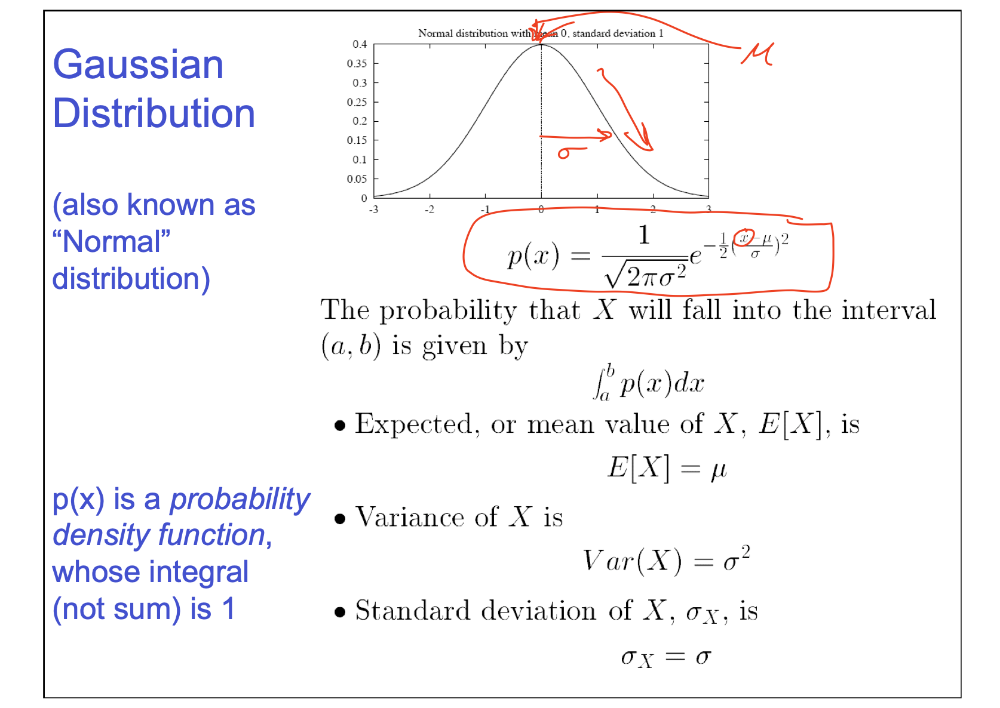

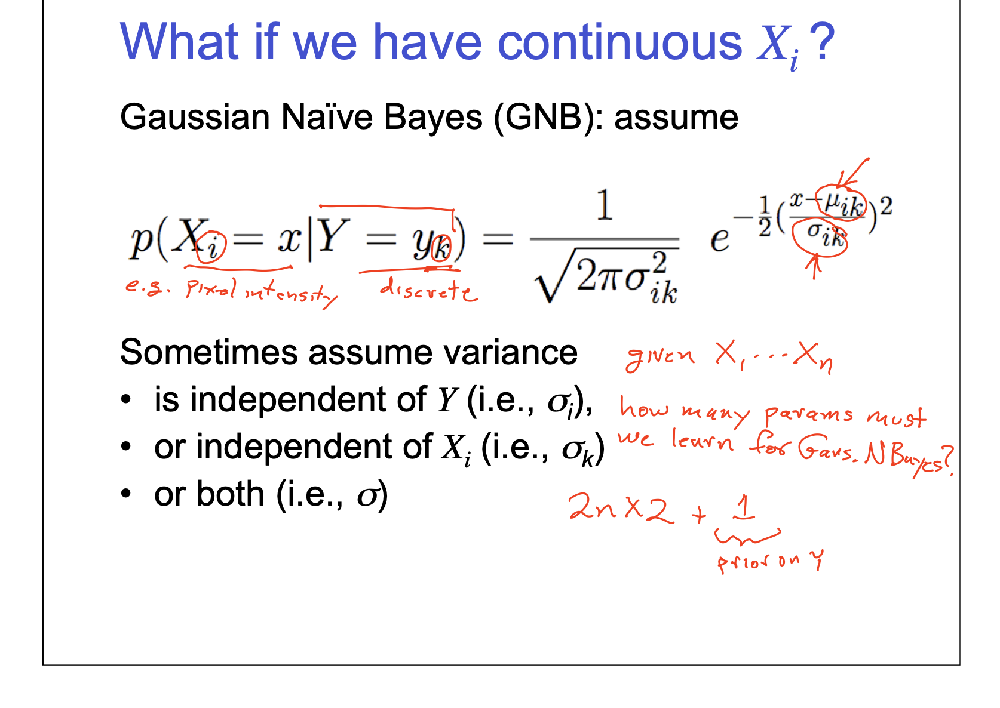!

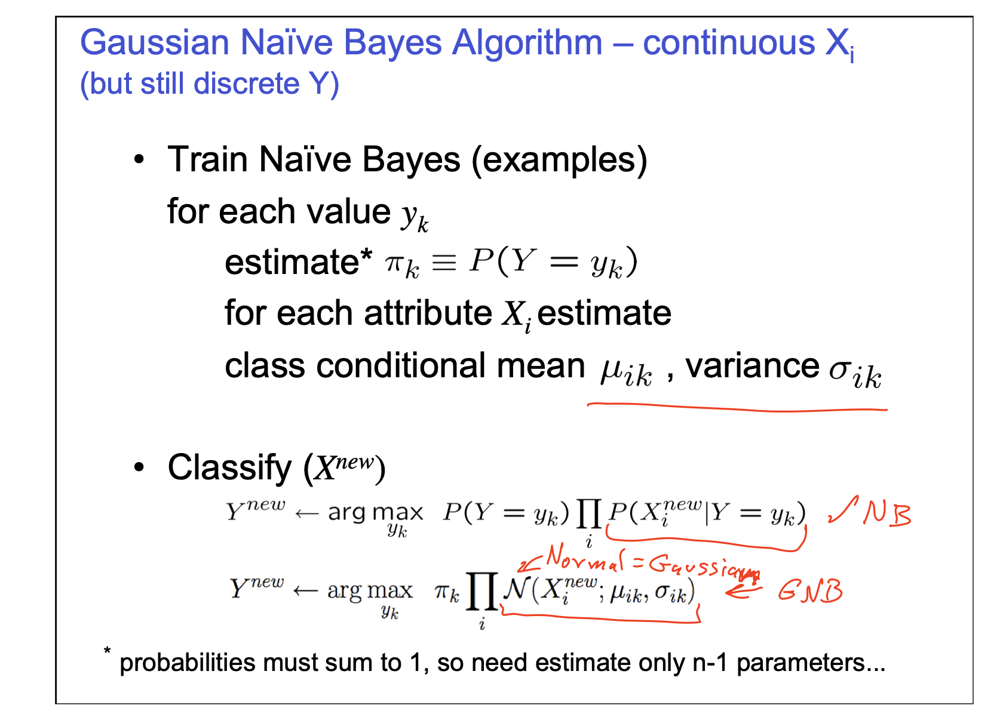!